# FPP optimization workflow 

In [518]:
using Revise
using FUSE
using IMAS
using Plots;
FUSE.logging(Logging.Info);

## Make new FPP equilibirum from scratch

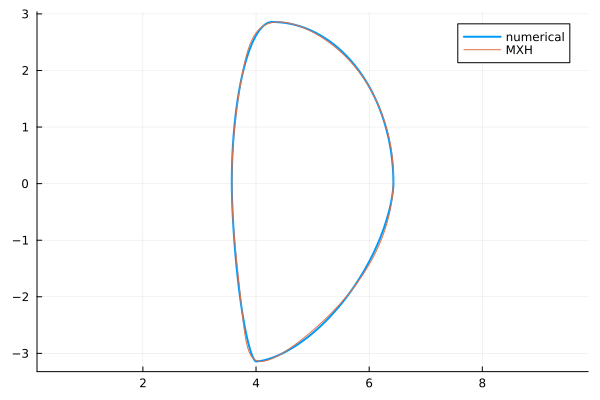

R0: 5.000054394587002
Z0: -0.14285714285714302
ϵ: 0.28570029868693436
κ: 2.1000799630875866
c0: 0.08929794323878393
c: [0.10289930275360348, -0.04364023802647035, -0.018031586770680792, -0.004081354979971939]
s: [0.502911649865262, 0.043980244414311205, -0.06211906809472907, 0.013187382063260922]


In [519]:
# CHEASE deadstart Miller
dd = IMAS.dd()
ini, act = FUSE.case_parameters(:FPP, version=:v1_demount, init_from=:scalars);
act.ActorEquilibrium.model = :CHEASE
act.ActorEquilibrium.symmetrize = false
act.ActorCHEASE.free_boundary = true
act.ActorCXbuild.rebuild_wall = true

ini.equilibrium.R0 = missing # 5.0
ini.equilibrium.B0 = 7.0
ini.equilibrium.ip = 8.5e6
ini.equilibrium.ϵ = missing # 1/3.5
ini.equilibrium.κ = missing # 2.1
ini.equilibrium.δ = missing # 0.6
ini.equilibrium.ζ = missing # 0.0

ini.build.plasma_gap = 0.2
ini.build.layers[:hfs_vacuum_vessel] += ini.build.layers[:hfs_vacuum_vessel_wall_inner] + ini.build.layers[:hfs_vacuum_vessel_wall_outer]
delete!(ini.build.layers,:hfs_vacuum_vessel_wall_inner)
delete!(ini.build.layers,:hfs_vacuum_vessel_wall_outer)
ini.build.layers[:lfs_vacuum_vessel] += ini.build.layers[:lfs_vacuum_vessel_wall_inner] + ini.build.layers[:lfs_vacuum_vessel_wall_outer]
delete!(ini.build.layers,:lfs_vacuum_vessel_wall_inner)
delete!(ini.build.layers,:lfs_vacuum_vessel_wall_outer)

mhx_order = 4
R0 = 5.0
eps = 1/3.5
a = R0*eps
kapu = 2.0
kapl = 2.2
delu = 0.5
dell = 0.7
zetaou = -0.0
zetaol = -0.2
zetaiu = -0.0
zetail = -0.2
upnull = false
lonull = false

r, z, zref = try
    IMAS.boundary_shape(; a, eps, kapu, kapl, delu, dell, zetaou, zetaiu, zetaol, zetail, zoffset=0.0, upnull, lonull)
catch e
    [NaN], [NaN], [NaN]
end

mxh = IMAS.MXH(r, z, mhx_order)
mxh_vect = IMAS.flat_coeffs(mxh)

ini.core_profiles.impurity = :Kr
ini.core_profiles.n_shaping = 1.5
ini.core_profiles.T_shaping = 2.0
ini.core_profiles.T_ratio = 1/0.85

ini.nbi.power_launched = 1e6
ini.nbi.beam_energy = 100e3

ini.equilibrium.boundary_from = :MXH_params
ini.equilibrium.MXH_params = mxh_vect
ini.equilibrium.xpoints_number = 1
ini.equilibrium.field_null_surface = 0.8

ini.build.symmetric = missing

ini.pf_active.n_coils_outside = 8

ini.gasc.filename = missing
ini.gasc.case = missing

plot(r, z; aspect_ratio=:equal, lw=2, label="numerical")
display(plot!(mxh,label="MXH"))
display(mxh)

#display(ini)
#display(act)

## Walk through WholeFacility Actors

 31.889036 seconds (3.14 M allocations: 504.628 MiB, 1.30% gc time)
GEOMETRY                       EQUILIBRIUM                    TEMPERATURES                   DENSITIES                      
───────────────────────────    ───────────────────────────    ───────────────────────────    ───────────────────────────    
R0 → 5 [m]                     B0 → 7 [T]                     Te0 → 10.5 [keV]               ne0 → 2.23e+20 [m⁻³]           
a → 1.43 [m]                   ip → 8.55 [MA]                 Ti0 → 8.93 [keV]               ne_ped → 1e+20 [m⁻³]           
1/ϵ → 3.5 [m]                  q95 → 5.41                     <Te> → 4.79 [keV]              <ne> → 1.42e+20 [m⁻³]          
κ → 2.1                        βpol → 1.39                    <Ti> → 4.07 [keV]              ne0/<ne> → 1.58                
δ → 0.483                      βtor → 0.0161                  Te0/<Te> → 2.2                 fGW → 1.26                     
ζ → -0.0524                    βn → 1.88                 

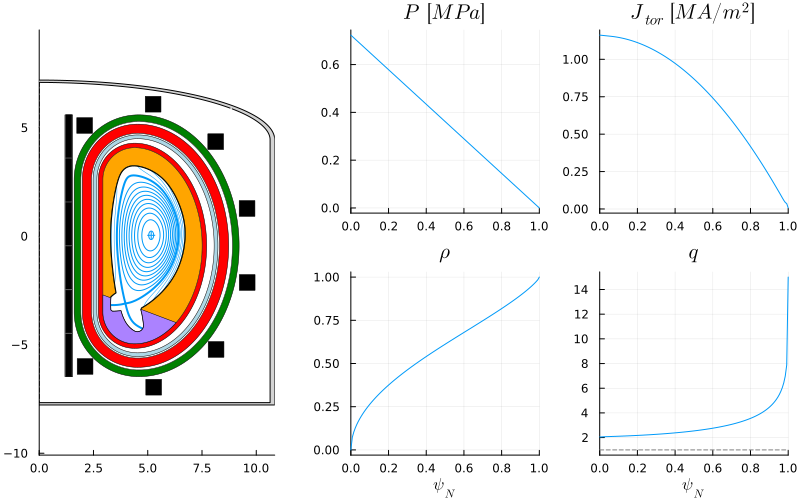

​


24×9 DataFrame
 Row │ group   details     type      ΔR         R_start   R_end     material      area       volume     
     │ String  String      String    Float64    Float64   Float64   String        Float64    Float64    
─────┼──────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                            1.18451     0.0       1.18451                14.2873      53.1667
   2 │ in                  oh        0.356867    1.18451   1.54138  ReBCO          4.30445     36.8618
   3 │ in                            0.0691759   1.54138   1.61055                 0.834384     8.26214
   4 │ hfs                 tf        0.30862     1.61055   1.91917  ReBCO          9.66063     97.7599
   5 │ hfs                           0.0691759   1.91917   1.98835                 3.62603    136.223
   6 │ hfs     low temp    shield    0.425762    1.98835   2.41411  Steel         12.0214     380.5
   7 │ hfs                           0.0691759   2.4141

​


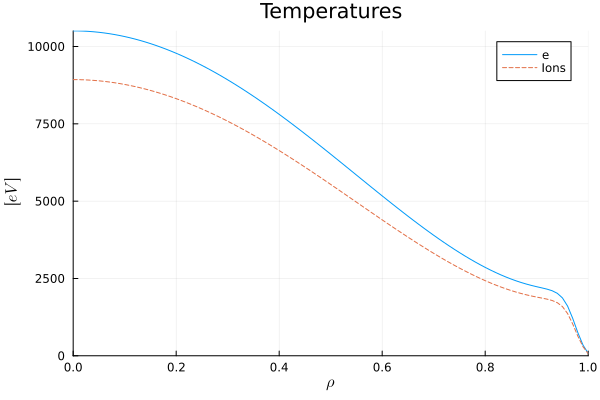

​


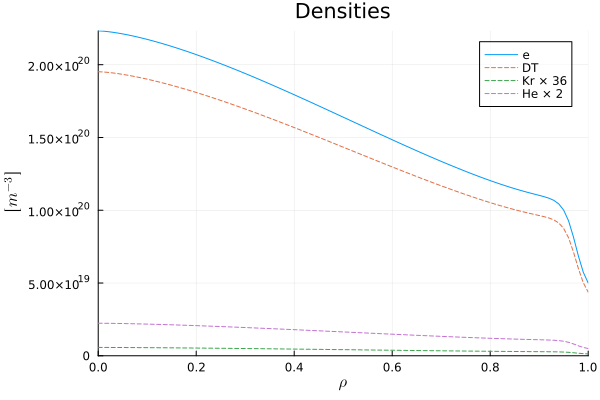

​


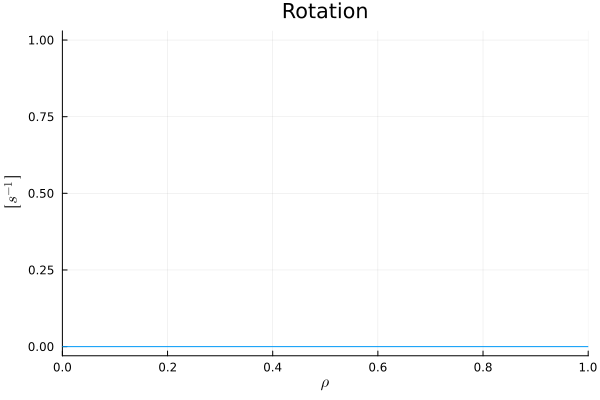

​


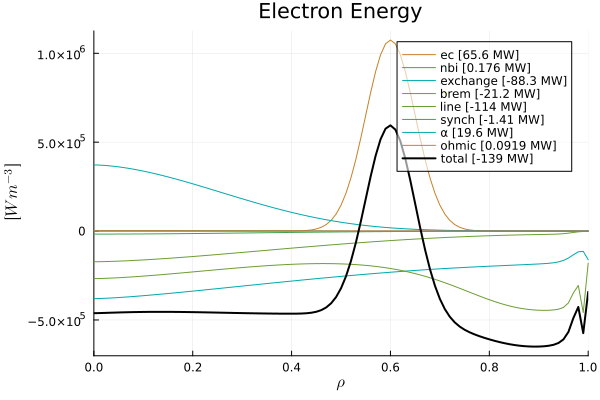

​


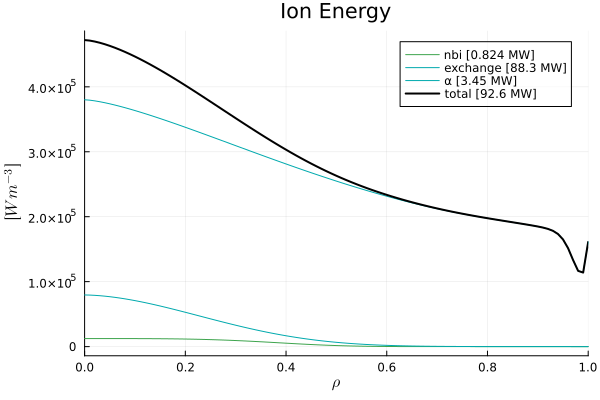

​


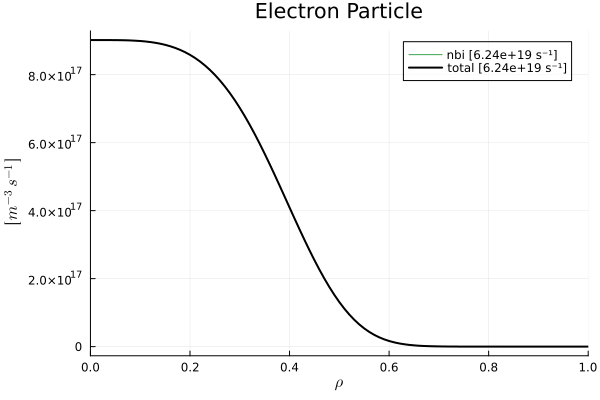

​


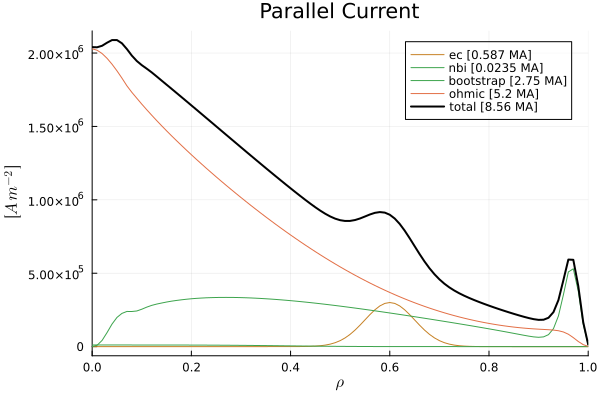

In [520]:
dd = IMAS.dd()
@time FUSE.init(dd, ini, act; do_plot=false);
dd.build.layer[8].material = "Steel, Stainless 316"
dd.build.layer[18].material = "Steel, Stainless 316"
dd.build.layer[24].material = "Steel, Stainless 316"
FUSE.digest(dd)

 * Status: success

 * Candidate solution
    Final objective value:     4.698270e-04

 * Found with
    Algorithm:     Nelder-Mead

 * Convergence measures
    √(Σ(yᵢ-ȳ)²)/n ≤ 1.0e-08

 * Work counters
    Seconds run:   1  (vs limit Inf)
    Iterations:    213
    f(x) calls:    399


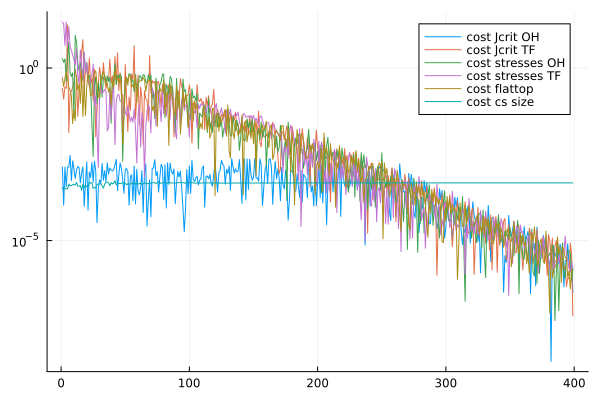

[OH.thickness, dd.build.oh.technology.fraction_stainless] = [0.5187491968969411, 0.7321642351893972]
[TFhfs.thickness, dd.build.tf.technology.fraction_stainless] = [0.8518419957873178, 0.7693743236875888]

target_B0 = 7.00011014
(dd.build.tf.max_b_field * TFhfs.end_radius) / R0 = 7.000110140000001

dd.build.oh.flattop_duration = 43200.063240642514
dd.requirements.flattop_duration = 43200.0

dd.build.oh.max_j = 2.4778853159782983e7
dd.build.oh.critical_j = 3.716826777496441e7

dd.build.tf.max_j = 2.515149264092169e7
dd.build.tf.critical_j = 3.77272364953171e7

maximum(dd.solid_mechanics.center_stack.stress.vonmises.oh) = 7.272716360885817e8
stainless_steel.yield_strength = 8.0e8

maximum(dd.solid_mechanics.center_stack.stress.vonmises.tf) = 7.272715404482912e8
stainless_steel.yield_strength = 8.0e8

old_R0 / a = 2.9143747719225694
R0 / a = 3.6089586561961795


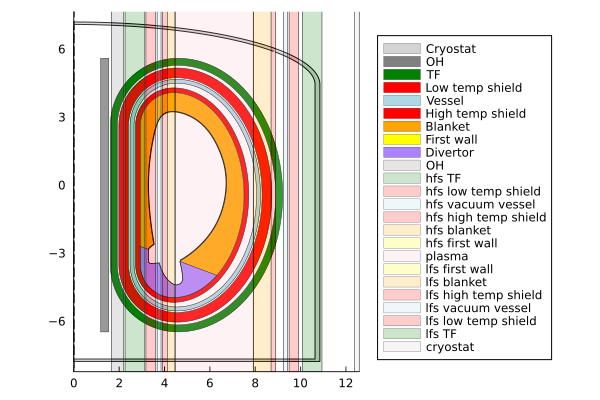

In [521]:
act.ActorHFSsizing.do_plot = true
act.ActorHFSsizing.verbose = true
act.ActorHFSsizing.j_tolerance = 0.5
act.ActorHFSsizing.stress_tolerance = 0.1
act.ActorHFSsizing.aspect_ratio_tolerance = 0.5

FUSE.ActorHFSsizing(dd, act);

In [529]:
FUSE.ActorLFSsizing(dd, act);

In [530]:
FUSE.ActorCXbuild(dd, act);

LoadError: BoundsError: attempt to access 0-element Vector{Float64} at index [1]

In [531]:
FUSE.ActorPassiveStructures(dd, act);

GEOMETRY                       EQUILIBRIUM                    TEMPERATURES                   DENSITIES                      
───────────────────────────    ───────────────────────────    ───────────────────────────    ───────────────────────────    
R0 → 5 [m]                     B0 → 7 [T]                     Te0 → 10.5 [keV]               ne0 → 2.23e+20 [m⁻³]           
a → 1.43 [m]                   ip → 8.55 [MA]                 Ti0 → 8.93 [keV]               ne_ped → 1e+20 [m⁻³]           
1/ϵ → 3.5 [m]                  q95 → 5.41                     <Te> → 4.79 [keV]              <ne> → 1.42e+20 [m⁻³]          
κ → 2.1                        βpol → 1.39                    <Ti> → 4.07 [keV]              ne0/<ne> → 1.58                
δ → 0.483                      βtor → 0.0161                  Te0/<Te> → 2.2                 fGW → 1.26                     
ζ → -0.0524                    βn → 1.88                      Ti0/<Ti> → 2.2                 zeff_ped → 2                   


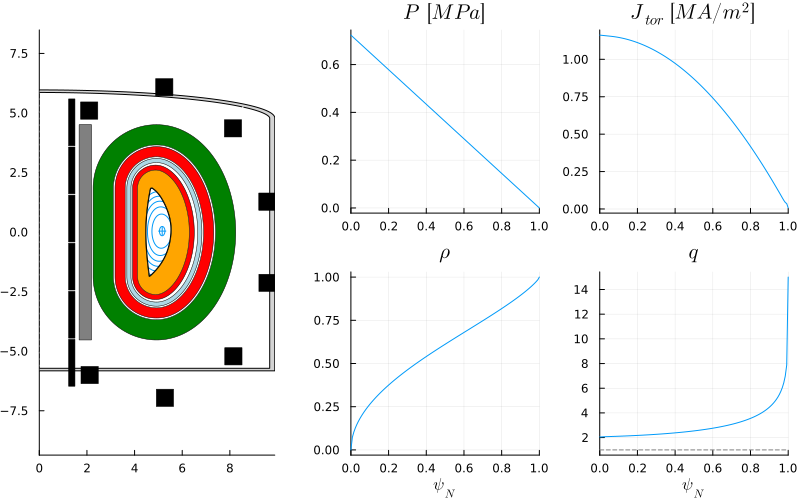

​


24×9 DataFrame
 Row │ group   details     type      ΔR         R_start  R_end    material      area       volume     
     │ String  String      String    Float64    Float64  Float64  String        Float64    Float64    
─────┼────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                            1.6716     0.0      1.6716                 15.1073      79.3358
   2 │ in                  oh        0.518749   1.6716   2.19035  ReBCO          4.68828     56.8812
   3 │ in                            0.0691759  2.19035  2.25952                 0.625187     8.73992
   4 │ hfs                 tf        0.851842   2.25952  3.11137  ReBCO         18.5784     188.002
   5 │ hfs                           0.0691759  3.11137  3.18054                 1.34363     43.1869
   6 │ hfs     low temp    shield    0.425762   3.18054  3.6063   Steel          7.38679    235.962
   7 │ hfs                           0.0691759  3.6063   3.67548       

​


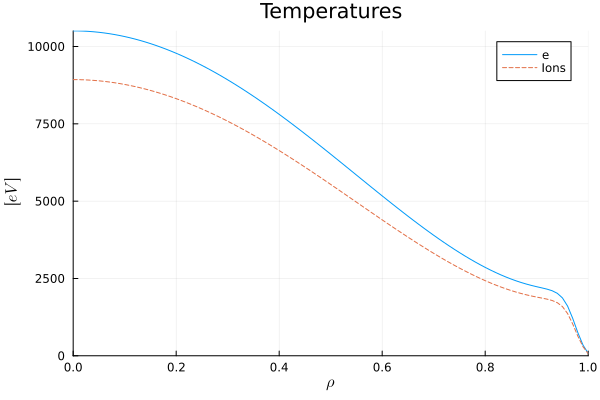

​


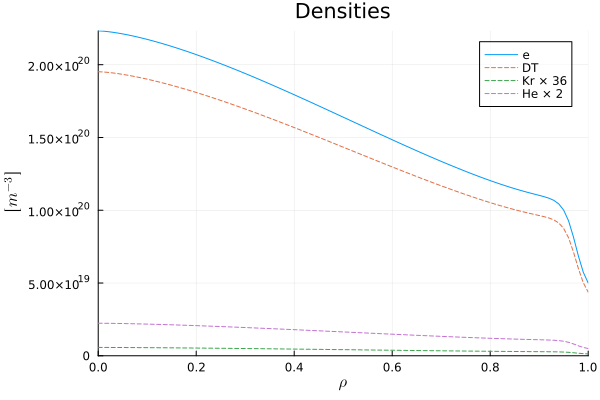

​


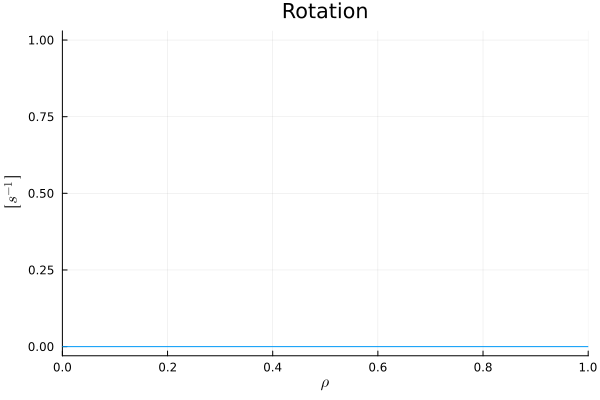

​


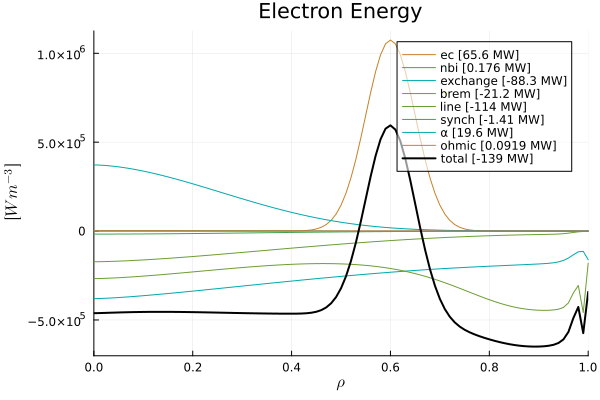

​


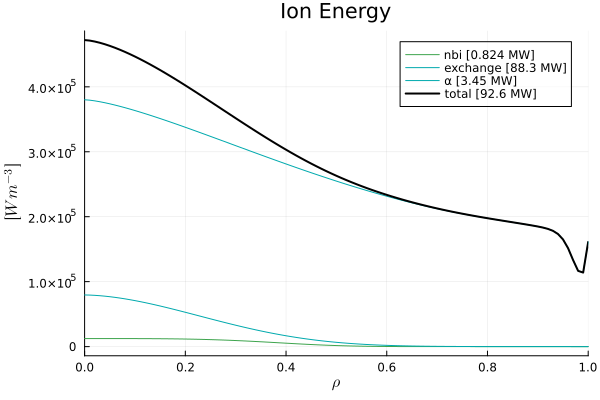

​


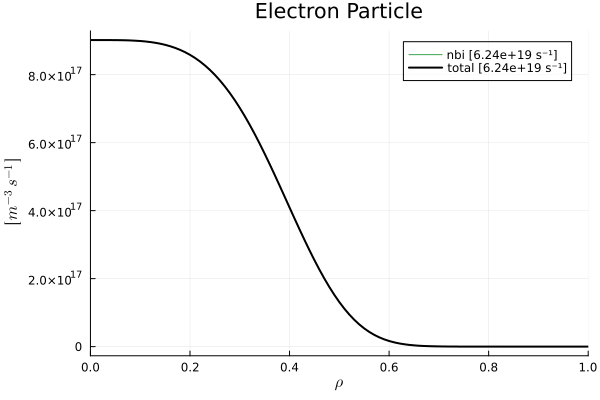

​


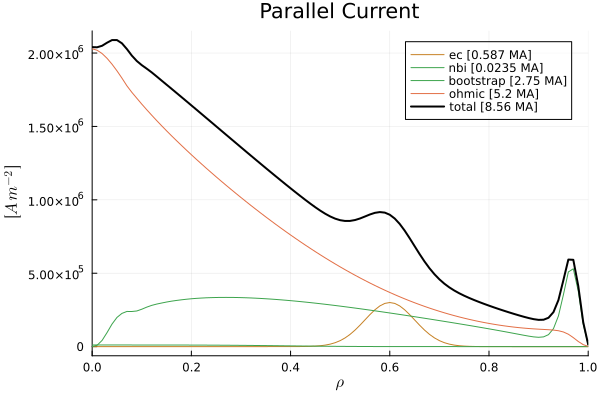

​


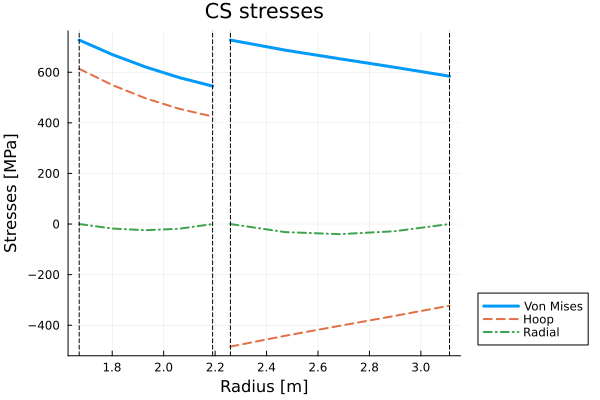

In [532]:
FUSE.digest(dd)

### EquilibriumTransport

In [486]:
act.ActorEquilibriumTransport.max_iter = 10
act.ActorEquilibriumTransport.do_plot = false
act.ActorCHEASE.free_boundary = true
act.ActorTauenn.transport_model = :ds03
act.ActorTauenn.confinement_factor = 0.95
act.ActorTauenn.T_shaping = 2.0
act.ActorTauenn.temp_pedestal_ratio = 0.85

display(act.ActorEquilibriumTransport)
display(act.ActorSteadyStateCurrent)
display(act.ActorHCD)
display(act.ActorECsimple)
display(act.ActorCoreTransport)
display(act.ActorTauenn)
display(act.ActorEquilibrium)
display(act.ActorCHEASE)

ActorEquilibriumTransport{Float64}
├─ do_plot ➡ false Plot
├─ max_iter ➡ 10 max number of transport-equilibrium iterations
└─ convergence_error ➡ 0.01 Convergence error threshold (relative change in current and pressure profiles)


ActorSteadyStateCurrent{Float64}


ActorHCD{Float64}
├─ ec_model ➡ :ECsimple EC source actor to run [:ECsimple]
├─ ic_model ➡ :ICsimple IC source actor to run [:ICsimple]
├─ lh_model ➡ :LHsimple LH source actor to run [:LHsimple]
└─ nb_model ➡ :NBsimple NB source actor to run [:NBsimple]


ActorECsimple{Float64}
├─ width ➡ 0.05 Width of the deposition profile
└─ rho_0 ➡ 0.6 Radial location of the deposition profile


ActorCoreTransport{Float64}
└─ model ➡ :Tauenn Transport actor to run [:Tauenn, :FluxMatcher]


ActorTauenn{Float64}
├─ error ➡ 0.01 Target convergence error
├─ eped_factor ➡ 1.0 Scaling parameter for EPED-NN prediction
├─ rho_fluxmatch ➡ 0.6 Radial location where flux-macthing is done
├─ T_shaping ➡ 2.0 Shaping coefficient for the temperature profile
├─ temp_pedestal_ratio ➡ 0.85 Ion to electron temperature ratio in the pedestal
├─ transport_model ➡ :ds03 Transport model [:tglfnn, :tglf, :h98y2, :ds03]
├─ warn_nn_train_bounds ➡ false Warn if EPED-NN / TGLF-NN training bounds are exceeded
├─ update_pedestal ➡ true update pedestal with eped_nn inside TAUENN
├─ confinement_factor ➡ 0.95 Confinement multiplier
├─ do_plot ➡ false Plot
└─ verbose ➡ false Verbose


ActorEquilibrium{Float64}
├─ model ➡ :CHEASE Equilibrium actor to run [:Solovev, :CHEASE]
└─ symmetrize ➡ false Force equilibrium up-down symmetry with respect to magnetic axis


ActorCHEASE{Float64}
├─ free_boundary ➡ true Convert fixed boundary equilibrium to free boundary one
├─ clear_workdir ➡ true Clean the temporary workdir for CHEASE
└─ rescale_eq_to_ip ➡ true Scale equilibrium to match Ip


285.927717 seconds (13.67 M allocations: 1.055 GiB, 0.26% gc time, 0.00% compilation time)
GEOMETRY                       EQUILIBRIUM                    TEMPERATURES                   DENSITIES                      
───────────────────────────    ───────────────────────────    ───────────────────────────    ───────────────────────────    
R0 → 5 [m]                     B0 → 7 [T]                     Te0 → 33.3 [keV]               ne0 → 2.23e+20 [m⁻³]           
a → 1.43 [m]                   ip → 8.46 [MA]                 Ti0 → 28.3 [keV]               ne_ped → 1e+20 [m⁻³]           
1/ϵ → 3.5 [m]                  q95 → 7.03                     <Te> → 12.7 [keV]              <ne> → 1.42e+20 [m⁻³]          
κ → 2.1                        βpol → 3.03                    <Ti> → 10.8 [keV]              ne0/<ne> → 1.58                
δ → 0.483                      βtor → 0.033                   Te0/<Te> → 2.62                fGW → 1.26                     
ζ → -0.0524                    βn 

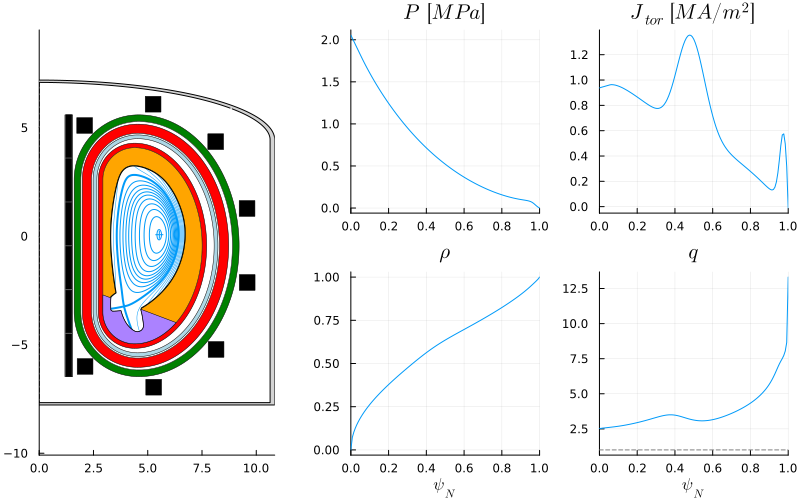

​


24×9 DataFrame
 Row │ group   details     type      ΔR         R_start   R_end     material      area       volume     
     │ String  String      String    Float64    Float64   Float64   String        Float64    Float64    
─────┼──────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                            1.18451     0.0       1.18451                14.2873      53.1667
   2 │ in                  oh        0.356867    1.18451   1.54138  ReBCO          4.30445     36.8618
   3 │ in                            0.0691759   1.54138   1.61055                 0.834384     8.26214
   4 │ hfs                 tf        0.30862     1.61055   1.91917  ReBCO          9.66063     97.7599
   5 │ hfs                           0.0691759   1.91917   1.98835                 3.62603    136.223
   6 │ hfs     low temp    shield    0.425762    1.98835   2.41411  Steel         12.0214     380.5
   7 │ hfs                           0.0691759   2.4141

​


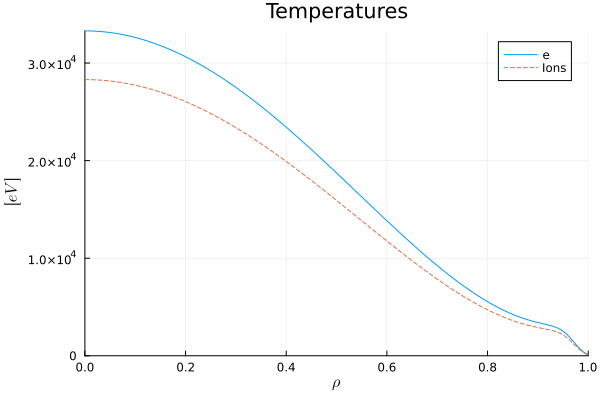

​


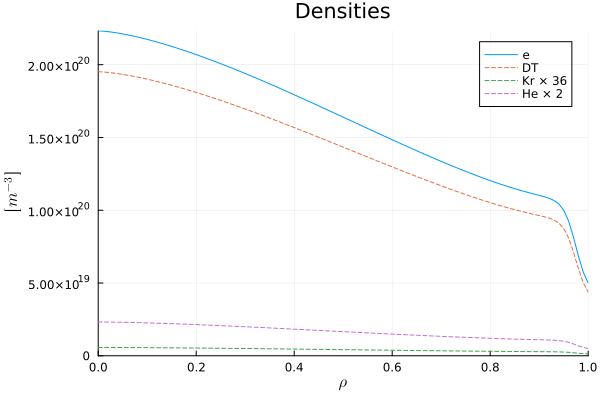

​


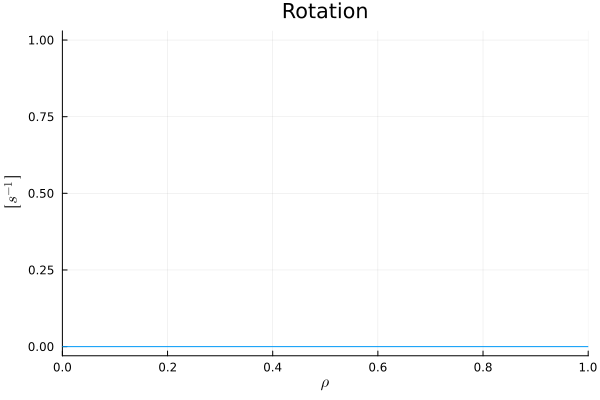

​


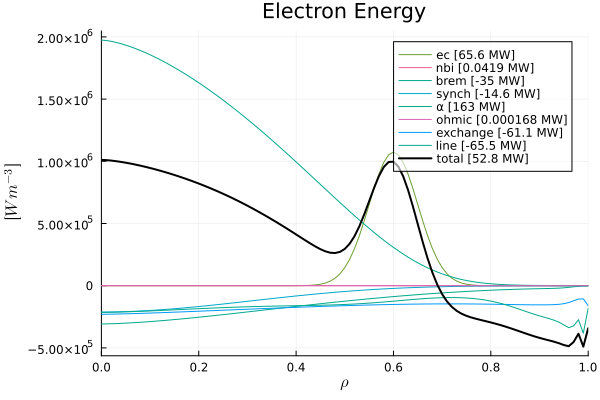

​


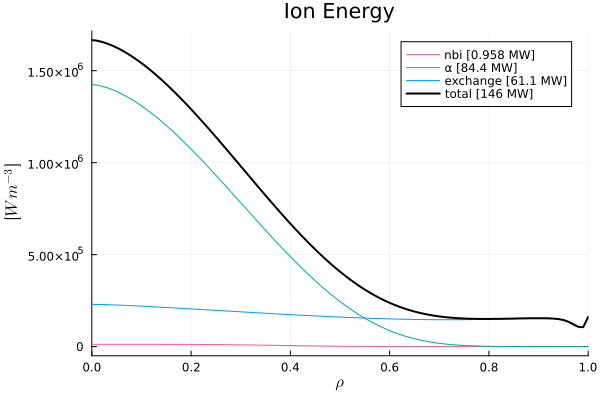

​


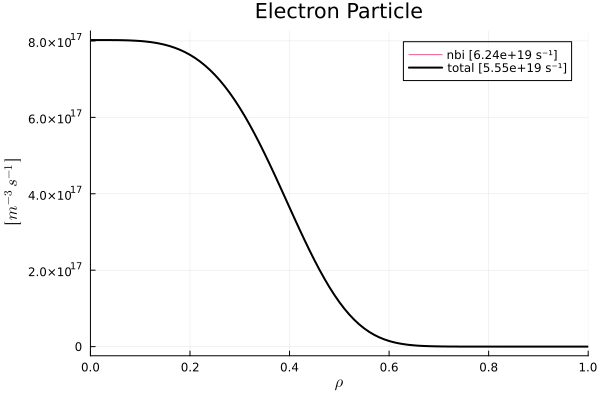

​


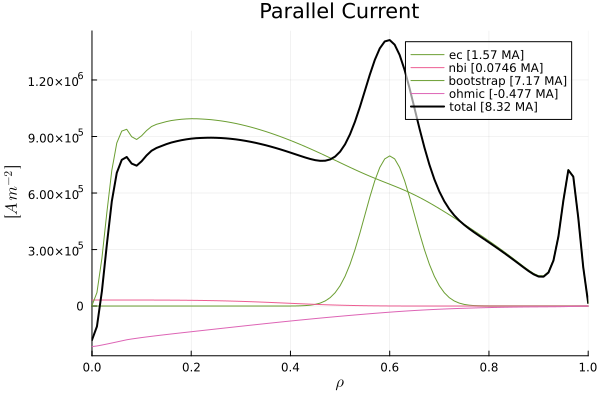

In [487]:
@time FUSE.ActorEquilibriumTransport(dd, act);
FUSE.digest(dd)

### StabilityLimits

In [488]:
act.ActorStabilityLimits.models = [:model_201, :model_301, :model_401]
act.ActorStabilityLimits.raise_on_breach = false

display(act.ActorStabilityLimits)

ActorStabilityLimits{Float64}
├─ models ➡ [:model_201, :model_301, :model_401] Models used for checking plasma stability limits: [:density_limit,
│  :beta_limits, :current_limit, :default_limits, :force_fail, :unknown, :model_401, :beta_model_105, :model_201,
│  :beta_bernard_1983, :model_301, :beta_tuda_1985, :beta_troyon_1985, :beta_troyon_1984]
└─ raise_on_breach ➡ false Raise an error when one or more stability limits are breached


In [489]:
@time FUSE.ActorStabilityLimits(dd, act);
dd.stability

  0.136563 seconds (2.95 k allocations: 435.914 KiB)


stability
├─ all_cleared ➡ Function
├─ model
│  ├─ 1
│  │  ├─ cleared ➡ Function
│  │  ├─ fraction ➡ [0.284325]
│  │  └─ identifier
│  │     ├─ description ➡ "q_95 > 2.0"
│  │     ├─ index ➡ 201
│  │     └─ name ➡ "Standard::q95"
│  ├─ 2
│  │  ├─ cleared ➡ Function
│  │  ├─ fraction ➡ [1.256]
│  │  └─ identifier
│  │     ├─ description ➡ "IMAS.greenwald_fraction < 1.0"
│  │     ├─ index ➡ 301
│  │     └─ name ➡ "Standard::IMAS_Greenwald"
│  └─ 3
│     ├─ cleared ➡ Function
│     ├─ fraction ➡ [0.863751]
│     └─ identifier
│        ├─ description ➡ "elongation < IMAS.elongation_limit"
│        ├─ index ➡ 401
│        └─ name ➡ "Standard elongation limit"
└─ time ➡ [0]


### HFSsizing

In [517]:
display(act.ActorHFSsizing)

ActorHFSsizing{Float64}
├─ j_tolerance ➡ 0.5 Tolerance on the OH and TF current limits (overrides ActorFluxSwing.j_tolerance)
├─ stress_tolerance ➡ 0.1 Tolerance on the OH and TF structural stresses limits
├─ aspect_ratio_tolerance ➡ 0.0 Tolerance on the aspect_ratio change
├─ do_plot ➡ true Plot
└─ verbose ➡ true Verbose


 * Status: success

 * Candidate solution
    Final objective value:     3.246951e-04

 * Found with
    Algorithm:     Nelder-Mead

 * Convergence measures
    √(Σ(yᵢ-ȳ)²)/n ≤ 1.0e-08

 * Work counters
    Seconds run:   2  (vs limit Inf)
    Iterations:    343
    f(x) calls:    613


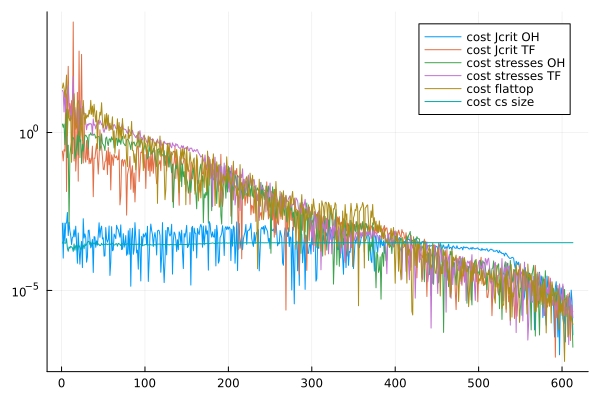

[OH.thickness, dd.build.oh.technology.fraction_stainless] = [0.057468579906441164, 0.6862608472163731]
[TFhfs.thickness, dd.build.tf.technology.fraction_stainless] = [0.9816219648209596, 0.7696429730992317]

target_B0 = 7.00011014
(dd.build.tf.max_b_field * TFhfs.end_radius) / R0 = 7.00011014

dd.build.oh.flattop_duration = 43199.9636383514
dd.requirements.flattop_duration = 43200.0

dd.build.oh.max_j = 9.338252707497646e7
dd.build.oh.critical_j = 1.40073845345164e8

dd.build.tf.max_j = 1.912502732155761e7
dd.build.tf.critical_j = 2.8687480333968356e7

maximum(dd.solid_mechanics.center_stack.stress.vonmises.oh) = 7.27272843542174e8
stainless_steel.yield_strength = 8.0e8

maximum(dd.solid_mechanics.center_stack.stress.vonmises.tf) = 7.272737053900524e8
stainless_steel.yield_strength = 8.0e8

old_R0 / a = 2.9143747719225694
R0 / a = 3.162317183609668


LoadError: AssertionError: Plasma aspect ratio changed more than 0.0% (8.507567869301003%)

In [491]:
@time FUSE.ActorHFSsizing(dd, act);

### LFSsizing

In [492]:
act.ActorLFSsizing.do_plot = true
act.ActorLFSsizing.verbose = true

display(act.ActorLFSsizing)

ActorLFSsizing{Float64}
├─ do_plot ➡ true Plot
└─ verbose ➡ true Verbose


TF outer leg radius changed by 0.20614988996360317 [m]
TF outer leg radius changed by 0.0 [m]


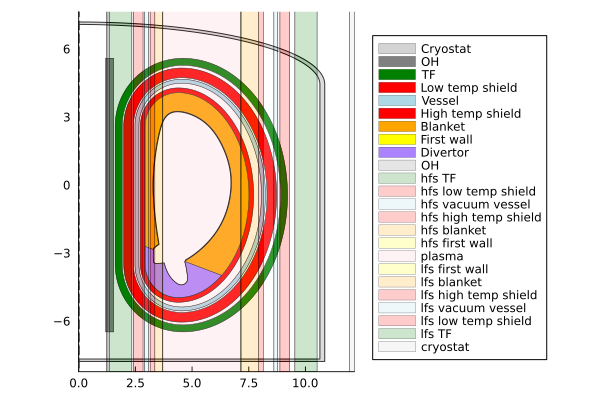

  0.267209 seconds (68.43 k allocations: 6.228 MiB)


In [493]:
@time FUSE.ActorLFSsizing(dd, act);

### CXbuild

In [494]:
act.ActorCXbuild.do_plot = true

display(act.ActorCXbuild)

ActorCXbuild{Float64}
├─ rebuild_wall ➡ true Rebuild wall based on equilibrium
└─ do_plot ➡ true Plot


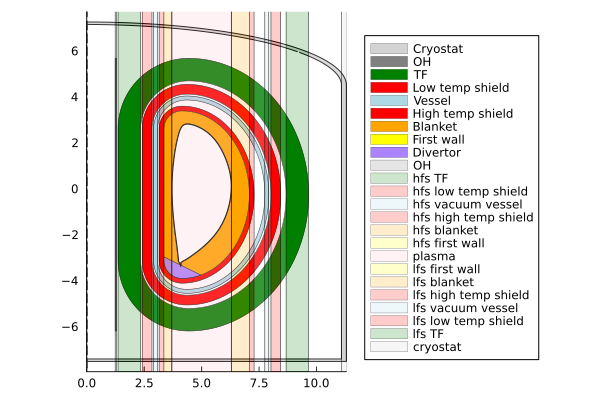

  3.420505 seconds (382.64 k allocations: 58.667 MiB)


In [495]:
@time FUSE.ActorCXbuild(dd, act);

### PFcoilsOpt

In [496]:
display(dd.equilibrium.time_slice[1])

act.ActorPFcoilsOpt.do_plot = true
act.ActorPFcoilsOpt.symmetric = false
act.ActorPFcoilsOpt.update_equilibrium = true
act.ActorPFcoilsOpt.optimization_scheme = :currents

display(act.ActorPFcoilsOpt)

1
├─ boundary
│  ├─ elongation ➡ Function
│  ├─ elongation_lower ➡ Function
│  ├─ elongation_upper ➡ Function
│  ├─ geometric_axis
│  │  ├─ r ➡ Function [m]
│  │  └─ z ➡ Function [m]
│  ├─ minor_radius ➡ Function [m]
│  ├─ squareness ➡ Function
│  ├─ squareness_lower_inner ➡ Function
│  ├─ squareness_lower_outer ➡ Function
│  ├─ squareness_upper_inner ➡ Function
│  ├─ squareness_upper_outer ➡ Function
│  ├─ triangularity ➡ Function
│  ├─ triangularity_lower ➡ Function
│  └─ triangularity_upper ➡ Function
├─ global_quantities
│  ├─ energy_mhd ➡ Function [J]
│  ├─ magnetic_axis
│  │  ├─ b_field_tor ➡ Function [T]
│  │  ├─ r ➡ Function [m]
│  │  └─ z ➡ Function [m]
│  ├─ psi_axis ➡ Function [Wb]
│  ├─ psi_boundary ➡ 0.1 [Wb]
│  ├─ q_95 ➡ Function
│  └─ q_axis ➡ Function
├─ profiles_1d
│  ├─ f ➡ Function [T.m]
│  ├─ geometric_axis
│  │  ├─ r ➡ Function [m]
│  │  └─ z ➡ Function [m]
│  ├─ j_parallel ➡ Function [A/m^2]
│  ├─ j_tor ➡ Function [A.m^-2]
│  ├─ psi ➡ [0.1] [Wb]
│  └─ psi_norm ➡ F

ActorPFcoilsOpt{Float64}
├─ green_model ➡ :simple Model used for the coils Green function calculations [:point, :simple, :corners, :realistic]
├─ symmetric ➡ false Force PF coils location to be up-down symmetric
├─ weight_currents ➡ 2.0 Weight of current limit constraint
├─ weight_strike ➡ 0.1 Weight given to matching the strike-points
├─ weight_lcfs ➡ 1.0 Weight given to matching last closed flux surface
├─ weight_null ➡ 1.0 Weight given to get field null for plasma breakdown
├─ maxiter ➡ 1000 Maximum number of optimizer iterations
├─ optimization_scheme ➡ :currents Type of PF coil optimization to carry out [:none, :currents, :rail]
├─ update_equilibrium ➡ true Overwrite target equilibrium with the one that the coils can actually make
├─ do_plot ➡ true Plot
└─ verbose ➡ false Verbose


┌ Warning: weight_strike>0 but no strike point found
└ @ FUSE ~/.julia/dev/FUSE/src/actors/pf/pf_active_actor.jl:554


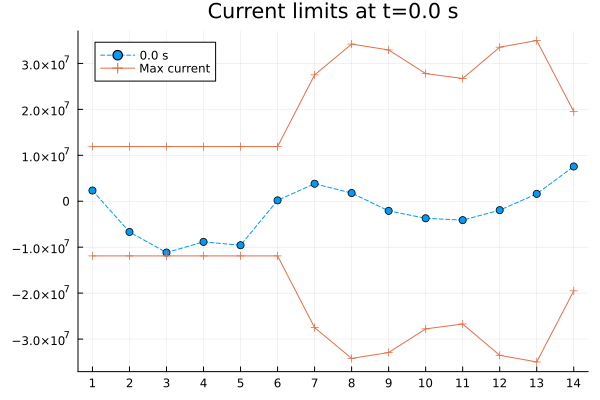

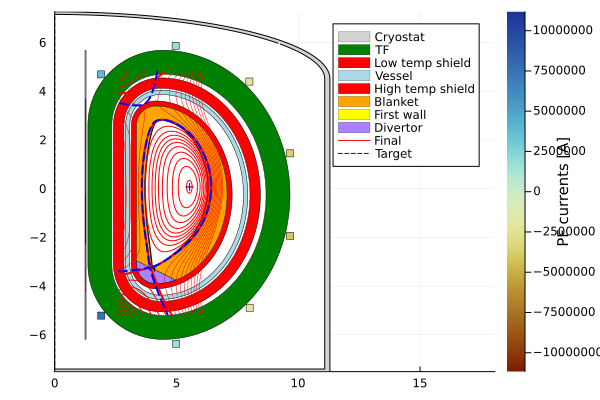

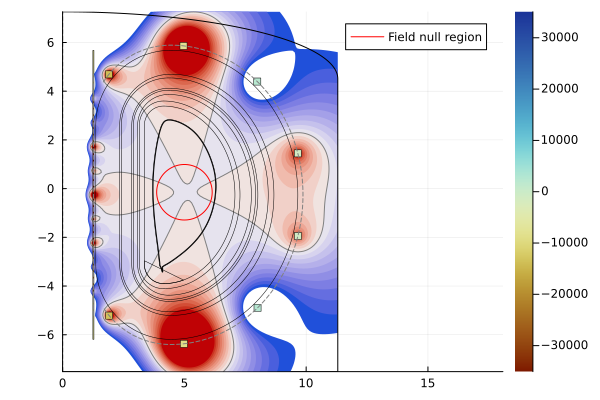

  4.139542 seconds (34.61 M allocations: 882.409 MiB, 11.96% gc time)


In [497]:
@time FUSE.ActorPFcoilsOpt(dd, act);

### PassiveStructures

In [498]:
act.ActorPassiveStructures.do_plot = true

display(act.ActorPassiveStructures)

ActorPassiveStructures{Float64}
└─ do_plot ➡ true Plot


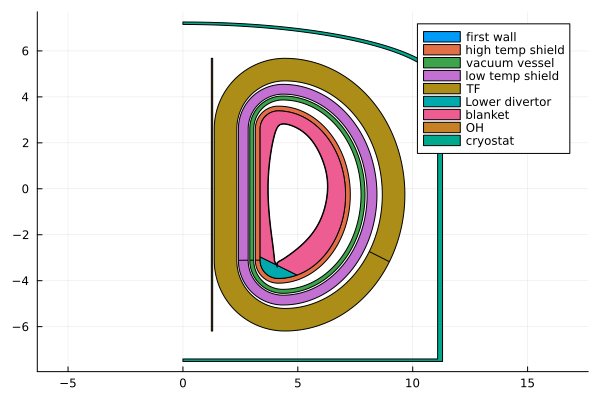

  0.220596 seconds (128.12 k allocations: 4.401 MiB)


In [499]:
@time FUSE.ActorPassiveStructures(dd, act);

### Neutronics

In [500]:
act.ActorNeutronics.do_plot = true

display(act.ActorNeutronics)

ActorNeutronics{Float64}
├─ N ➡ 100000 Number of particles
└─ do_plot ➡ true Plot


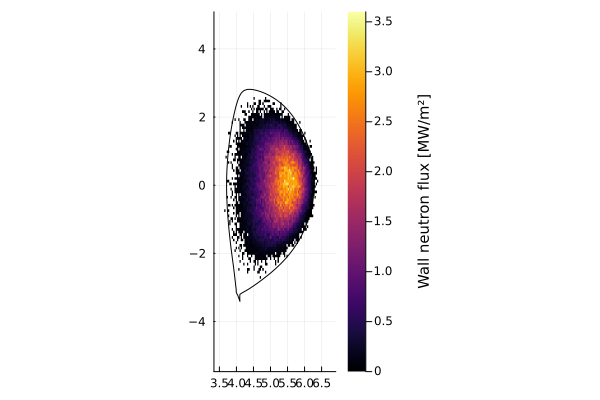

 20.460556 seconds (277.88 M allocations: 6.341 GiB, 9.36% gc time)


In [501]:
@time FUSE.ActorNeutronics(dd, act);

### Blanket

In [502]:
display(act.ActorBlanket)

ActorBlanket{Float64}
├─ minimum_first_wall_thickness ➡ 0.02 [m] Minimum first wall thickness
├─ blanket_multiplier ➡ 1.2 Neutron thermal power multiplier in blanket
├─ thermal_power_extraction_efficiency ➡ 1.0 Fraction of thermal power that is carried out by the coolant at the blanket
│  interface, rather than being lost in the surrounding strutures.
└─ verbose ➡ false Verbose


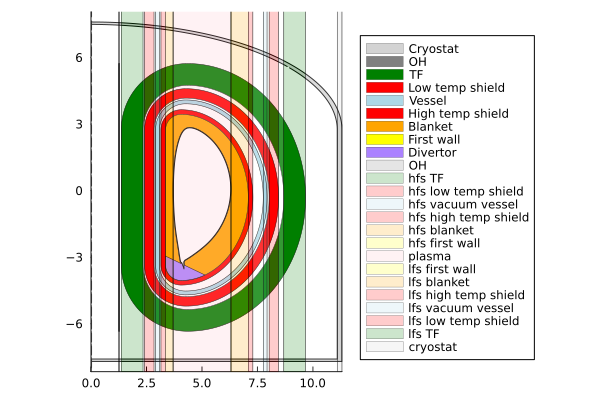

  3.896178 seconds (11.24 M allocations: 311.538 MiB, 3.08% gc time)


In [503]:
@time FUSE.ActorBlanket(dd, act);

In [504]:
dd.blanket

blanket
├─ module
│  └─ 1
│     ├─ layer
│     │  ├─ 1
│     │  │  ├─ material ➡ "Tungsten"
│     │  │  ├─ midplane_thickness ➡ 0.0200741 [m]
│     │  │  └─ name ➡ "lfs first wall"
│     │  ├─ 2
│     │  │  ├─ material ➡ "lithium-lead: Li6/7=50.000"
│     │  │  ├─ midplane_thickness ➡ 0.768238 [m]
│     │  │  └─ name ➡ "lfs blanket"
│     │  └─ 3
│     │     ├─ material ➡ "Steel, Stainless 316"
│     │     ├─ midplane_thickness ➡ 0.207528 [m]
│     │     └─ name ➡ "lfs high temp shield"
│     ├─ name ➡ "blanket"
│     └─ time_slice
│        └─ 1
│           ├─ neutron_shine_through ➡ NaN
│           ├─ power_incident_neutrons ➡ NaN [W]
│           ├─ power_incident_radiated ➡ NaN [W]
│           ├─ power_thermal_extracted ➡ NaN [W]
│           ├─ power_thermal_neutrons ➡ NaN [W]
│           ├─ power_thermal_radiated ➡ NaN [W]
│           └─ tritium_breeding_ratio ➡ NaN
├─ time ➡ [0] [s]
└─ tritium_breeding_ratio ➡ [NaN]


### Divertors

In [505]:
display(act.ActorDivertors)

ActorDivertors{Float64}
└─ thermal_power_extraction_efficiency ➡ 1.0 Fraction of thermal power that is carried out by the coolant at the divertor
   interface, rather than being lost in the surrounding strutures.


In [506]:
@time FUSE.ActorDivertors(dd, act);

  0.216174 seconds (34.11 k allocations: 2.264 MiB)


In [507]:
dd.divertors

divertors
├─ divertor
│  └─ 1
│     ├─ name ➡ "Lower divertor"
│     ├─ power_incident
│     │  ├─ data ➡ [1.99229e+08] [W]
│     │  └─ time ➡ [0] [s]
│     ├─ power_neutrals
│     │  ├─ data ➡ [0] [W]
│     │  └─ time ➡ [0] [s]
│     ├─ power_radiated
│     │  ├─ data ➡ [0] [W]
│     │  └─ time ➡ [0] [s]
│     ├─ power_recombination_neutrals
│     │  ├─ data ➡ [0] [W]
│     │  └─ time ➡ [0] [s]
│     └─ power_thermal_extracted
│        ├─ data ➡ [1.99229e+08] [W]
│        └─ time ➡ [0] [s]
└─ time ➡ [0] [s]


### BalanceOfPlant

In [508]:
act.ActorBalanceOfPlant.do_plot = true

display(act.ActorBalanceOfPlant)

ActorBalanceOfPlant{Float64}
├─ generator_conversion_efficiency ➡ 0.95 Efficiency of the generator
└─ do_plot ➡ true Plot


In [509]:
@time FUSE.ActorBalanceOfPlant(dd, act);

LoadError: KeyError: key "blanket" not found

In [510]:
dd.balance_of_plant.thermal_cycle

thermal_cycle
├─ flow_rate ➡ [NaN] [kg/s]
├─ generator_conversion_efficiency ➡ [0.95]
├─ input_work ➡ [NaN] [W]
├─ net_work ➡ [NaN] [W]
├─ power_electric_generated ➡ Function [W]
├─ thermal_efficiency ➡ [NaN]
├─ total_useful_heat_power ➡ Function [W]
└─ turbine_work ➡ [NaN] [W]


### Costing

In [511]:
act.ActorCosting.model = :Sheffield

display(act.ActorCosting)

ActorCosting{Float64}
├─ model ➡ :Sheffield Costing model [:FUSE, :ARIES, :Sheffield]
├─ construction_start_year ➡ 2023 [year] Year that plant construction begins
├─ future_inflation_rate ➡ 0.025 Predicted average rate of future inflation
├─ plant_lifetime ➡ 40 [year] Lifetime of the plant
├─ availability ➡ 0.8 Availability fraction of the plant
├─ land_space ➡ 1000.0 [acres] Plant site space required
├─ building_volume ➡ 140000.0 [m^3] Volume of the tokmak building
├─ interest_rate ➡ 0.05 Annual interest rate fraction of direct capital cost
├─ indirect_cost_rate ➡ 0.4 Indirect cost associated with construction, equipment, services, engineering construction
│  management and owners cost
├─ escalation_fraction ➡ 0.05 Yearly escalation fraction based on risk assessment
├─ blanket_lifetime ➡ 6.8 [year] Lifetime of the blanket
├─ construction_lead_time ➡ 8.0 [year] Duration of construction
├─ fixed_charge_rate ➡ 0.078 Constant dollar fixed charge rate
├─ initial_cost_blanket ➡ 200.0 [$M] C

In [512]:
@time FUSE.ActorCosting(dd, act);

┌ Warning: Blanket costs do not include replacements since electric power isn't generated
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_Sheffield.jl:159
┌ Warning: Divertor costs do not include replacements since electric power isn't generated
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_Sheffield.jl:176


  0.168605 seconds (21.50 k allocations: 3.702 MiB)


In [513]:
display(dd.costing)
display(dd.costing.cost_direct_capital.cost)

costing
├─ construction_start_year ➡ 2023 [year]
├─ cost_decommissioning
│  └─ cost ➡ Function [$M]
├─ cost_direct_capital
│  ├─ cost ➡ Function [$M]
│  └─ system
│     ├─ 1
│     │  ├─ cost ➡ Function [$M]
│     │  ├─ name ➡ "tokamak"
│     │  └─ subsystem
│     │     ├─ 1
│     │     │  ├─ cost ➡ NaN [$M]
│     │     │  └─ name ➡ "main heat transfer system"
│     │     ├─ 2
│     │     │  ├─ cost ➡ 49377.9 [$M]
│     │     │  └─ name ➡ "primary coils"
│     │     ├─ 3
│     │     │  ├─ cost ➡ 486.213 [$M]
│     │     │  └─ name ➡ "aux power"
│     │     ├─ 4
│     │     │  ├─ cost ➡ 457.482 [$M]
│     │     │  └─ name ➡ "shielding gaps"
│     │     ├─ 5
│     │     │  ├─ cost ➡ 200 [$M]
│     │     │  └─ name ➡ "blanket"
│     │     ├─ 6
│     │     │  ├─ cost ➡ 101.577 [$M]
│     │     │  └─ name ➡ "structure"
│     │     └─ 7
│     │        ├─ cost ➡ 8 [$M]
│     │        └─ name ➡ "divertor"
│     └─ 2
│        ├─ cost ➡ Function [$M]
│        ├─ name ➡ "Facility"
│        └─ subs

NaN

## Summary

GEOMETRY                       EQUILIBRIUM                    TEMPERATURES                   DENSITIES                      
───────────────────────────    ───────────────────────────    ───────────────────────────    ───────────────────────────    
R0 → 5 [m]                     B0 → 7 [T]                     Te0 → 33.3 [keV]               ne0 → 2.23e+20 [m⁻³]           
a → 1.43 [m]                   ip → 8.44 [MA]                 Ti0 → 28.3 [keV]               ne_ped → 1e+20 [m⁻³]           
1/ϵ → 3.5 [m]                  q95 → 7                        <Te> → 12.7 [keV]              <ne> → 1.42e+20 [m⁻³]          
κ → 2.1                        βpol → 3.02                    <Ti> → 10.8 [keV]              ne0/<ne> → 1.58                
δ → 0.483                      βtor → 0.0331                  Te0/<Te> → 2.62                fGW → 1.26                     
ζ → -0.0524                    βn → 3.9                       Ti0/<Ti> → 2.62                zeff_ped → 2                   


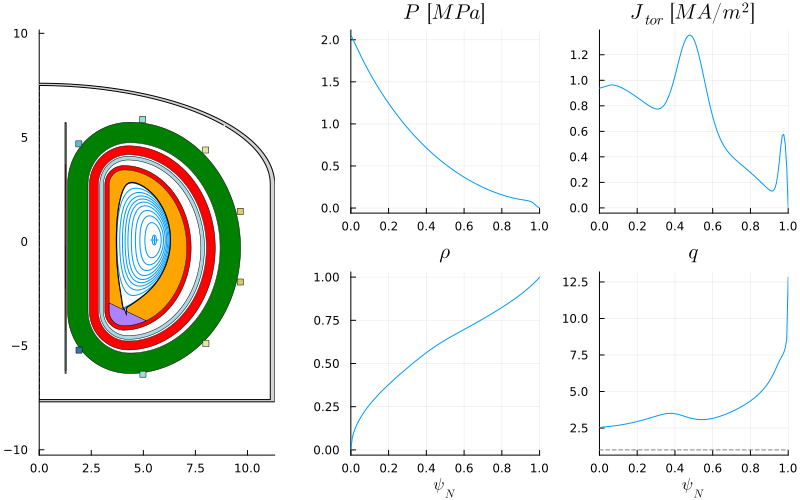

​


24×9 DataFrame
 Row │ group   details     type      ΔR         R_start   R_end     material      area       volume     
     │ String  String      String    Float64    Float64   Float64   String        Float64    Float64    
─────┼──────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                            1.23648     0.0       1.23648                14.9168      57.9445
   2 │ in                  oh        0.0574686   1.23648   1.29395  ReBCO          0.693297     5.51141
   3 │ in                            0.0691759   1.29395   1.36312                 0.834533     6.96621
   4 │ hfs                 tf        0.981622    1.36312   2.34474  ReBCO         29.6825     300.369
   5 │ hfs                           0.0691759   2.34474   2.41392                 4.03849    155.842
   6 │ hfs     low temp    shield    0.425762    2.41392   2.83968  Steel         10.5869     337.476
   7 │ hfs                           0.0691759   2.83

​


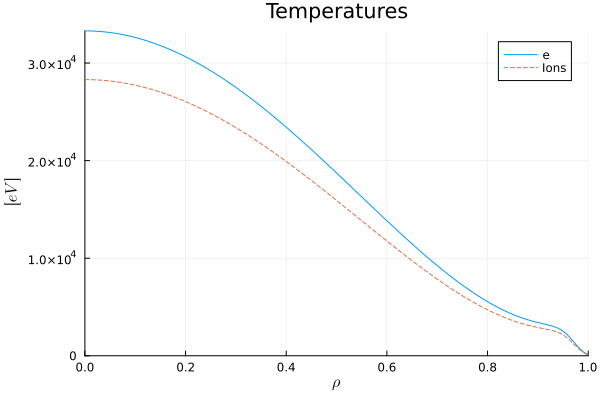

​


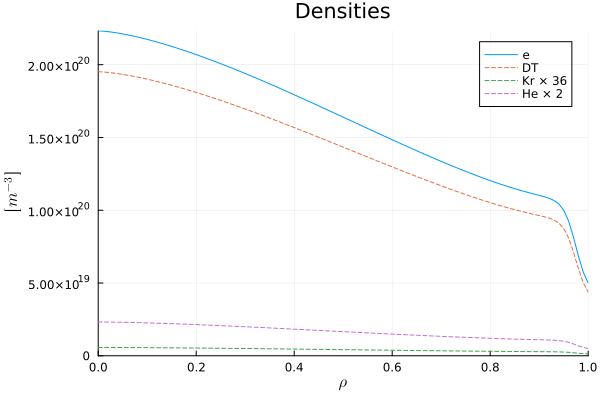

​


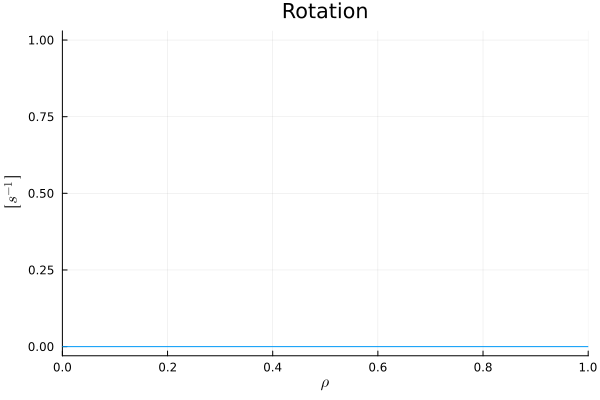

​


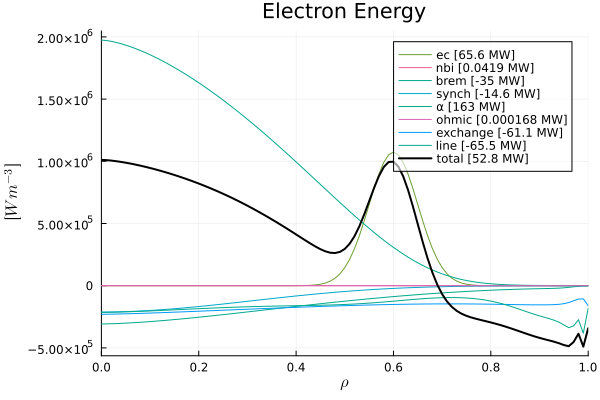

​


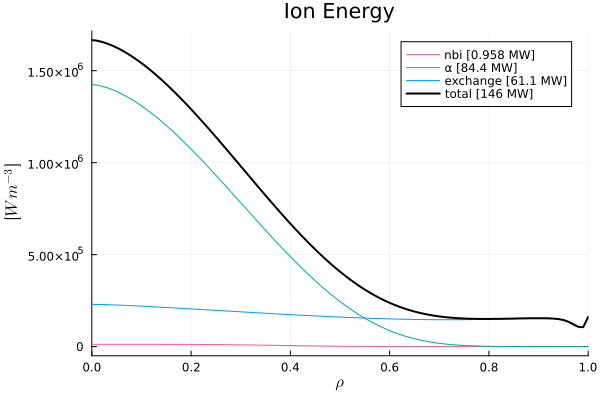

​


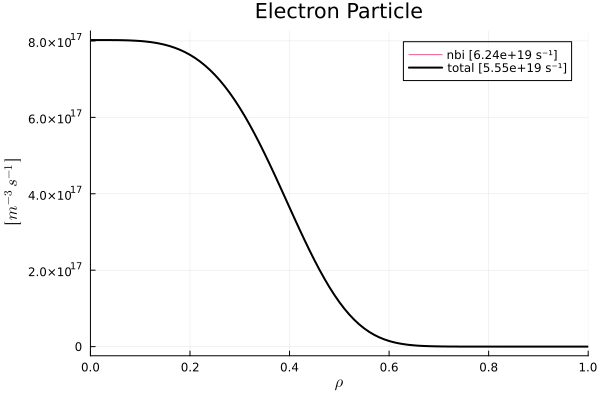

​


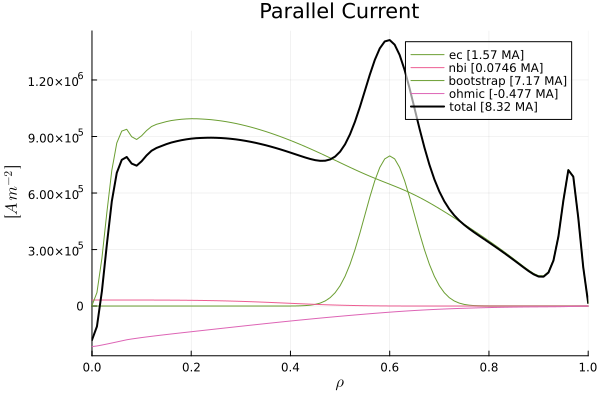

​


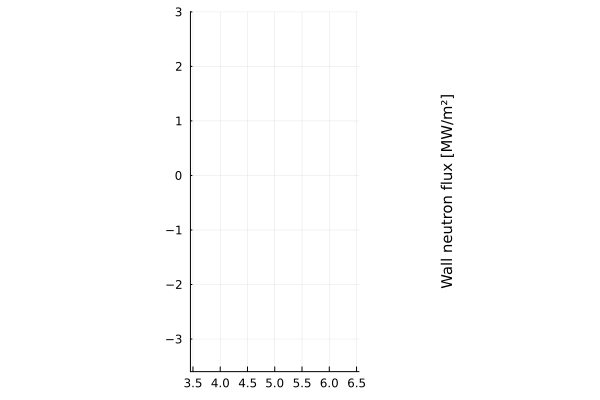

​


GKS: Rectangle definition is invalid in routine SET_WINDOW
GKS: Rectangle definition is invalid in routine CELLARRAY
invalid range


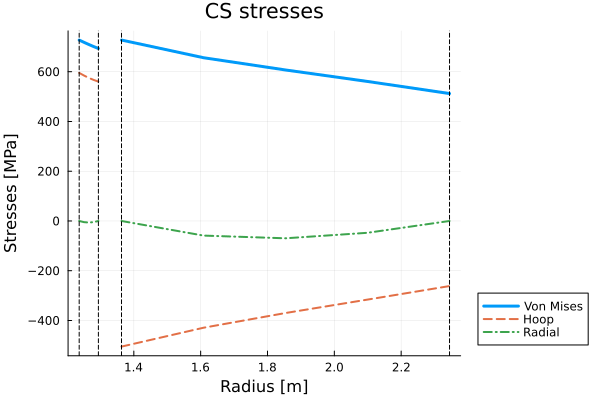

​


In [514]:
FUSE.digest(dd)

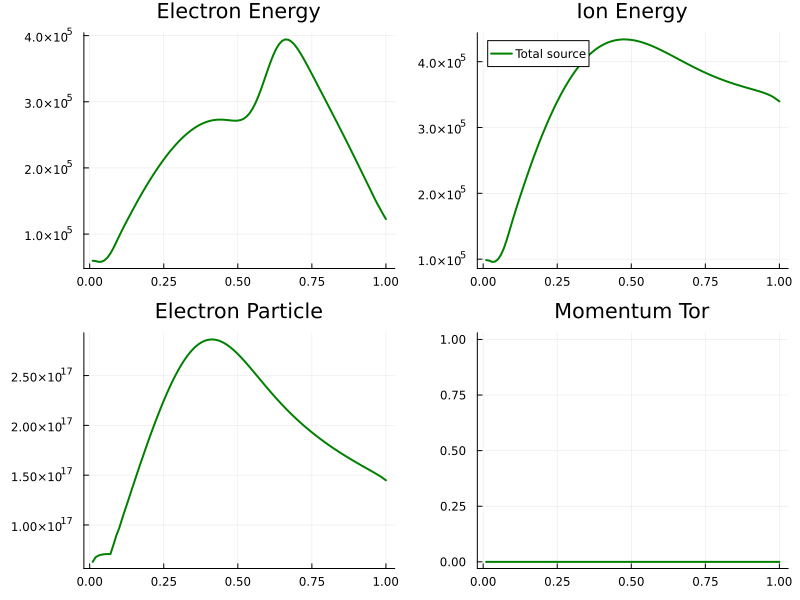

In [515]:
plot(dd.core_transport)

In [516]:
dd.build.layer[14]

14
├─ area ➡ Function [m^2]
├─ end_radius ➡ Function [m]
├─ fs ➡ -1
├─ identifier ➡ 8020416500513164811
├─ material ➡ "Tungsten"
├─ name ➡ "lfs first wall"
├─ outline
│  ├─ r ➡ Function [m]
│  └─ z ➡ Function [m]
├─ shape ➡ Function
├─ shape_parameters ➡ Function
├─ start_radius ➡ Function [m]
├─ thickness ➡ 0.0200741 [m]
├─ type ➡ 5
└─ volume ➡ Function [m^3]
